In [1]:
import sys
sys.path.append('../')
import numpy as np
from IPython.display import HTML

from rover_simulator.sensor import ImaginalStereoCamera, ImaginalLiDAR
from rover_simulator.world import World, Obstacle
from rover_simulator.rover import BasicRover, RoverAnimation
from rover_simulator.history import SimpleHistory
from rover_simulator.navigation.localizer import ImaginalLocalizer
from rover_simulator.navigation.controller import ConstantSpeedController
from rover_simulator.navigation.mapper import GridMapper, TableMapper

In [2]:
world = World()
world.read_objects("../rover_simulator/examples/environment_simple.txt")

In [3]:
grid_width = 0.5
rover_r = 0.5
sensor = ImaginalStereoCamera(obstacles=world.obstacles)
mapper = GridMapper(grid_size=np.array([20, 20]), grid_width=grid_width, sensor=sensor, rover_r=rover_r)
# mapper = TableMapper(sensor=sensor, rover_r=rover_r)
history = SimpleHistory(sensor=sensor)

rover = BasicRover(
    np.array([18.0, 1.0, np.pi]), rover_r,
    sensor=sensor,
    mapper=mapper,
    localizer=ImaginalLocalizer(),
    controller=ConstantSpeedController(w=-np.pi/32),
    history=history
)
world.append_rover(rover)

In [4]:
world.reset(reset_rovers=False, reset_obstacles=False)
world.simulate(200)

  0%|          | 0/200 [00:00<?, ?it/s]

In [5]:
world.animate(xlim=[0, 20], ylim=[0, 20], enlarge_range=rover.r)
HTML(world.ani.to_jshtml())

  0%|          | 0/200 [00:00<?, ?it/s]

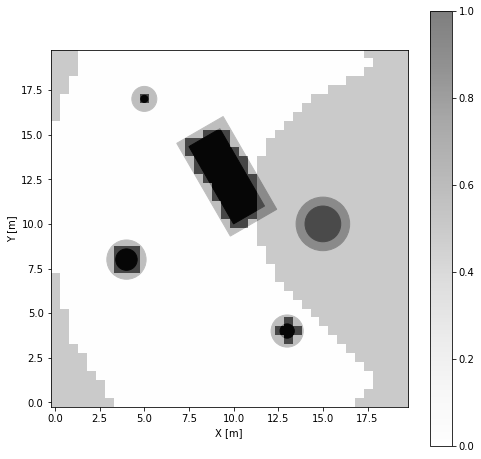

In [ ]:
mapper.draw(
    xlim=[0-mapper.grid_width/2, 20-mapper.grid_width/2],
    ylim=[0-mapper.grid_width/2, 20-mapper.grid_width/2],
    obstacles=world.obstacles,
    enlarge_range=rover.r
)

In [ ]:
# rover.mapper.fig.savefig("log/mapper.jpg")

In [8]:
rover_animation = RoverAnimation(world, rover, None)
rover_animation.animate(
    #xlim=[0-rover.mapper.grid_width/2, 20-rover.mapper.grid_width/2], ylim=[0-rover.mapper.grid_width/2, 20-rover.mapper.grid_width/2],
    xlim=[0, 20], ylim=[0, 20],
    enlarge_range=rover.r,
    map_name='map',
    #save_path="mapper.mp4"
)
HTML(rover_animation.ani.to_jshtml())

  0%|          | 0/200 [00:00<?, ?it/s]

c:\Users\k1100\AppData\Local\Programs\Python\Python39\lib\site-packages\matplotlib\transforms.py:2058: RuntimeWarning: invalid value encountered in scalar multiply
  self._mtx[0, 1] *= sx
c:\Users\k1100\AppData\Local\Programs\Python\Python39\lib\site-packages\matplotlib\transforms.py:2059: RuntimeWarning: invalid value encountered in scalar multiply
  self._mtx[0, 2] *= sx
c:\Users\k1100\AppData\Local\Programs\Python\Python39\lib\site-packages\matplotlib\transforms.py:2060: RuntimeWarning: invalid value encountered in scalar multiply
  self._mtx[1, 0] *= sy
c:\Users\k1100\AppData\Local\Programs\Python\Python39\lib\site-packages\matplotlib\transforms.py:2062: RuntimeWarning: invalid value encountered in scalar multiply
  self._mtx[1, 2] *= sy


<Figure size 432x288 with 0 Axes>